<a href="https://colab.research.google.com/github/gkdivya/EVA/blob/main/8_AdvancedTrainingConcepts/experiments/Cifar10_with_resnet34_BN_OneCycle/Cifar10_with_resnet34_BN_OneCycle.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import libraries

In [1]:
!pip install git+https://github.com/albumentations-team/albumentations.git
!pip install torchsummary

  Cloning https://github.com/albumentations-team/albumentations.git to /tmp/pip-req-build-1ez2ghys
  Running command git clone -q https://github.com/albumentations-team/albumentations.git /tmp/pip-req-build-1ez2ghys
  Created wheel for albumentations: filename=albumentations-1.0.0-cp37-none-any.whl size=98531 sha256=586a7f1acbd6a9cbefe3cd2ca454f3107094b8cce68b5bc691427b5a3c73e9ad
  Stored in directory: /tmp/pip-ephem-wheel-cache-_i_hql3q/wheels/e2/85/3e/2a40fac5cc1f43ced656603bb2fca1327b30ec7de1b1b66517
Successfully built albumentations
  Found existing installation: albumentations 0.1.12
    Uninstalling albumentations-0.1.12:
      Successfully uninstalled albumentations-0.1.12


In [2]:
!git clone https://github.com/gkdivya/torch_cv_wrapper.git

Cloning into 'torch_cv_wrapper'...
remote: Enumerating objects: 234, done.
remote: Counting objects: 100% (234/234), done.
remote: Compressing objects: 100% (224/224), done.
remote: Total 234 (delta 133), reused 0 (delta 0), pack-reused 0
Receiving objects: 100% (234/234), 55.89 KiB | 6.21 MiB/s, done.
Resolving deltas: 100% (133/133), done.


In [3]:
!git clone https://github.com/gkdivya/eva.git

Cloning into 'eva'...
remote: Enumerating objects: 2183, done.
remote: Counting objects: 100% (1006/1006), done.
remote: Compressing objects: 100% (648/648), done.
remote: Total 2183 (delta 758), reused 336 (delta 336), pack-reused 1177
Receiving objects: 100% (2183/2183), 16.10 MiB | 13.01 MiB/s, done.
Resolving deltas: 100% (1243/1243), done.


In [4]:
from __future__ import print_function
import torchvision
import torch
from pprint import pprint
# Let's visualize some of the images
%matplotlib inline
import matplotlib.pyplot as plt

## Import Custom Libraries
from torch_cv_wrapper.utils import plot_metrics,train,test,helper
from torch_cv_wrapper.utils.gradcam import generate_gradcam, plot_gradcam
from torch_cv_wrapper.model import resnet
from torch_cv_wrapper.main import TriggerEngine

## Load config file

In [5]:
config = helper.process_config("/content/eva/8_AdvancedTrainingConcepts/experiments/Cifar10_with_resnet34_BN_OneCycle/config.yaml")
use_cuda = torch.cuda.is_available()
helper.set_seed(config['model_params']['seed'],use_cuda)
device = torch.device("cuda" if use_cuda else "cpu")
pprint(config)

 loading Configuration of your experiment ..
{'criterion': 'CrossEntropyLoss',
 'data_augmentation': {'type': 'CIFAR10Albumentation'},
 'data_loader': {'args': {'batch_size': 256,
                          'num_workers': 2,
                          'pin_memory': True},
                 'classes': ['plane',
                             'car',
                             'bird',
                             'cat',
                             'deer',
                             'dog',
                             'frog',
                             'horse',
                             'ship',
                             'truck'],
                 'type': 'Cifar10DataLoader'},
 'lr_scheduler': 'OneCycleLR',
 'model': 'Resnet34',
 'model_params': {'dropout': 0.05,
                  'experiment_name': 'Cifar10_with_resnet34_BN_OneCycleLR',
                  'model_dir': './model/',
                  'seed': 1},
 'optimizer': {'args': {'lr': 0.001}, 'type': 'optim.Adam'},
 'training_pa

## Create Training Instance

In [6]:
exp_metrics={}
experiment_name=config['model_params']['experiment_name']
trigger_training=TriggerEngine(config)

## Download data and view sample images

In [7]:
classes= config['data_loader']['classes']

#Get dataloaders
train_loader,test_loader = trigger_training.dataloader()


Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


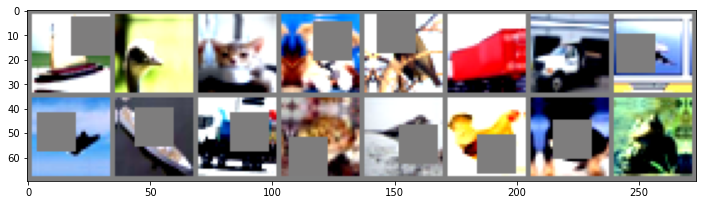

In [8]:
# get some random training images
images, labels = iter(train_loader).next()

# # show images
helper.imshow(torchvision.utils.make_grid(images[:16]))

## Model Summary

In [9]:
model = resnet.ResNet34("BN")
model.to(device)
trigger_training.model_summary(model,(3,32,32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 32, 32]           1,728
       BatchNorm2d-2           [-1, 64, 32, 32]             128
            Conv2d-3           [-1, 64, 32, 32]          36,864
       BatchNorm2d-4           [-1, 64, 32, 32]             128
            Conv2d-5           [-1, 64, 32, 32]          36,864
       BatchNorm2d-6           [-1, 64, 32, 32]             128
        BasicBlock-7           [-1, 64, 32, 32]               0
            Conv2d-8           [-1, 64, 32, 32]          36,864
       BatchNorm2d-9           [-1, 64, 32, 32]             128
           Conv2d-10           [-1, 64, 32, 32]          36,864
      BatchNorm2d-11           [-1, 64, 32, 32]             128
       BasicBlock-12           [-1, 64, 32, 32]               0
           Conv2d-13           [-1, 64, 32, 32]          36,864
      BatchNorm2d-14           [-1, 64,

## Trigger training

In [10]:
# trigger_training.
(exp_metrics[experiment_name]) = trigger_training.run_experiment(model,train_loader,test_loader)
#trigger_training.save_experiment(model,experiment_name,"/content/drive/MyDrive/Cifar10_Resnet/saved_models")

  0%|          | 0/196 [00:00<?, ?it/s]

using OneCycleLR
Epoch 1:


Loss=1.49018394947052 Batch_id=195 LR=0.00006 Accuracy=40.53: 100%|██████████| 196/196 [01:48<00:00,  1.80it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0067, Accuracy: 4268/10000 (42.68%)

Epoch 2:


Loss=1.4285072088241577 Batch_id=195 LR=0.00010 Accuracy=53.79: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0055, Accuracy: 5122/10000 (51.22%)

Epoch 3:


Loss=1.067447304725647 Batch_id=195 LR=0.00018 Accuracy=60.75: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0045, Accuracy: 6149/10000 (61.49%)

Epoch 4:


Loss=0.9242956042289734 Batch_id=195 LR=0.00028 Accuracy=65.85: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0032, Accuracy: 7250/10000 (72.50%)

Epoch 5:


Loss=0.8389361500740051 Batch_id=195 LR=0.00040 Accuracy=69.85: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0066, Accuracy: 5519/10000 (55.19%)

Epoch 6:


Loss=0.8828810453414917 Batch_id=195 LR=0.00052 Accuracy=72.38: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0038, Accuracy: 6847/10000 (68.47%)

Epoch 7:


Loss=0.7413342595100403 Batch_id=195 LR=0.00064 Accuracy=74.83: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0037, Accuracy: 6933/10000 (69.33%)

Epoch 8:


Loss=0.6938968896865845 Batch_id=195 LR=0.00076 Accuracy=76.09: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0028, Accuracy: 7630/10000 (76.30%)

Epoch 9:


Loss=0.5081573724746704 Batch_id=195 LR=0.00086 Accuracy=78.24: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0038, Accuracy: 7209/10000 (72.09%)

Epoch 10:


Loss=0.5706840753555298 Batch_id=195 LR=0.00094 Accuracy=79.18: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0029, Accuracy: 7745/10000 (77.45%)

Epoch 11:


Loss=0.4676729142665863 Batch_id=195 LR=0.00098 Accuracy=80.56: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0034, Accuracy: 7539/10000 (75.39%)

Epoch 12:


Loss=0.556471049785614 Batch_id=195 LR=0.00100 Accuracy=81.66: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0022, Accuracy: 8187/10000 (81.87%)

Epoch 13:


Loss=0.5965405106544495 Batch_id=195 LR=0.00100 Accuracy=82.73: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0022, Accuracy: 8188/10000 (81.88%)

Epoch 14:


Loss=0.544817328453064 Batch_id=195 LR=0.00099 Accuracy=83.44: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0021, Accuracy: 8263/10000 (82.63%)

Epoch 15:


Loss=0.683056116104126 Batch_id=195 LR=0.00097 Accuracy=84.11: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0025, Accuracy: 8031/10000 (80.31%)

Epoch 16:


Loss=0.435371458530426 Batch_id=195 LR=0.00095 Accuracy=84.70: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0016, Accuracy: 8671/10000 (86.71%)

Epoch 17:


Loss=0.6036004424095154 Batch_id=195 LR=0.00092 Accuracy=85.53: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0019, Accuracy: 8501/10000 (85.01%)

Epoch 18:


Loss=0.45986661314964294 Batch_id=195 LR=0.00089 Accuracy=85.95: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0028, Accuracy: 7839/10000 (78.39%)

Epoch 19:


Loss=0.35763224959373474 Batch_id=195 LR=0.00085 Accuracy=86.49: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0016, Accuracy: 8696/10000 (86.96%)

Epoch 20:


Loss=0.277874618768692 Batch_id=195 LR=0.00081 Accuracy=86.95: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0022, Accuracy: 8303/10000 (83.03%)

Epoch 21:


Loss=0.30120664834976196 Batch_id=195 LR=0.00077 Accuracy=87.55: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0019, Accuracy: 8489/10000 (84.89%)

Epoch 22:


Loss=0.32591110467910767 Batch_id=195 LR=0.00072 Accuracy=88.11: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0016, Accuracy: 8714/10000 (87.14%)

Epoch 23:


Loss=0.3395548164844513 Batch_id=195 LR=0.00066 Accuracy=88.40: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0013, Accuracy: 8920/10000 (89.20%)

Epoch 24:


Loss=0.18670473992824554 Batch_id=195 LR=0.00061 Accuracy=89.47: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0019, Accuracy: 8605/10000 (86.05%)

Epoch 25:


Loss=0.21826744079589844 Batch_id=195 LR=0.00056 Accuracy=89.77: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0021, Accuracy: 8440/10000 (84.40%)

Epoch 26:


Loss=0.21727028489112854 Batch_id=195 LR=0.00050 Accuracy=90.62: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0016, Accuracy: 8761/10000 (87.61%)

Epoch 27:


Loss=0.24028880894184113 Batch_id=195 LR=0.00044 Accuracy=91.17: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0012, Accuracy: 9031/10000 (90.31%)

Epoch 28:


Loss=0.13083042204380035 Batch_id=195 LR=0.00039 Accuracy=91.76: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0014, Accuracy: 8934/10000 (89.34%)

Epoch 29:


Loss=0.1427912414073944 Batch_id=195 LR=0.00033 Accuracy=92.42: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0015, Accuracy: 8923/10000 (89.23%)

Epoch 30:


Loss=0.21807678043842316 Batch_id=195 LR=0.00028 Accuracy=93.25: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0011, Accuracy: 9186/10000 (91.86%)

Epoch 31:


Loss=0.16564854979515076 Batch_id=195 LR=0.00023 Accuracy=94.04: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0011, Accuracy: 9166/10000 (91.66%)

Epoch 32:


Loss=0.15634088218212128 Batch_id=195 LR=0.00019 Accuracy=94.63: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0009, Accuracy: 9315/10000 (93.15%)

Epoch 33:


Loss=0.12776385247707367 Batch_id=195 LR=0.00015 Accuracy=95.05: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0009, Accuracy: 9287/10000 (92.87%)

Epoch 34:


Loss=0.08258720487356186 Batch_id=195 LR=0.00011 Accuracy=95.86: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0009, Accuracy: 9348/10000 (93.48%)

Epoch 35:


Loss=0.10006383806467056 Batch_id=195 LR=0.00008 Accuracy=96.42: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0008, Accuracy: 9381/10000 (93.81%)

Epoch 36:


Loss=0.11080960929393768 Batch_id=195 LR=0.00005 Accuracy=96.81: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0008, Accuracy: 9420/10000 (94.20%)

Epoch 37:


Loss=0.07683622092008591 Batch_id=195 LR=0.00003 Accuracy=96.93: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0008, Accuracy: 9441/10000 (94.41%)

Epoch 38:


Loss=0.2209663689136505 Batch_id=195 LR=0.00001 Accuracy=97.28: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0008, Accuracy: 9445/10000 (94.45%)

Epoch 39:


Loss=0.07995174080133438 Batch_id=195 LR=0.00000 Accuracy=97.37: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0007, Accuracy: 9448/10000 (94.48%)

Epoch 40:


Loss=0.04407501965761185 Batch_id=195 LR=0.00000 Accuracy=97.47: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]



Test set: Average loss: 0.0007, Accuracy: 9452/10000 (94.52%)



## Missclassification

Total wrong predictions are 548
Files already downloaded and verified


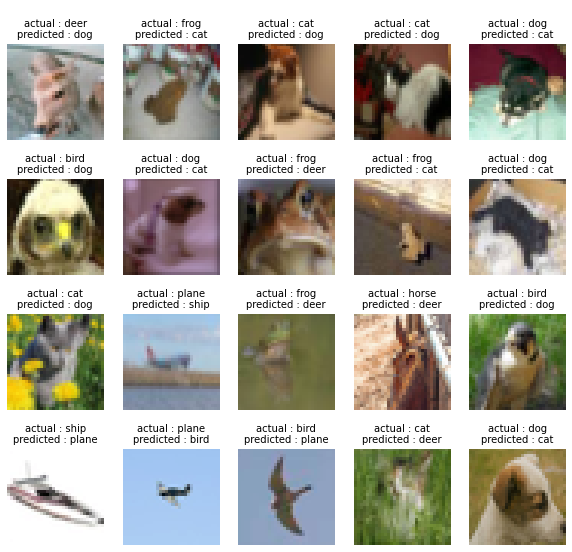

In [11]:
misclassified_images = trigger_training.wrong_predictions(model,test_loader)

## Plots for Validation Loss and Accuracy

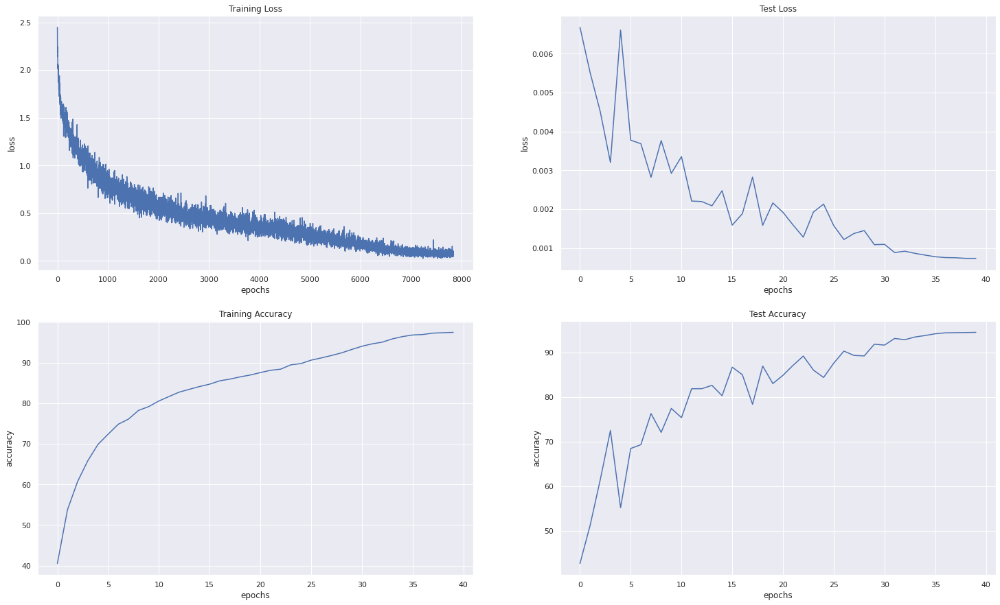

In [12]:
plot_metrics.plot_metrics(exp_metrics[experiment_name])

## Accuracy for each class

In [13]:
helper.class_level_accuracy(model, test_loader, device, classes)

Accuracy of plane : 95 %
Accuracy of   car : 97 %
Accuracy of  bird : 91 %
Accuracy of   cat : 88 %
Accuracy of  deer : 95 %
Accuracy of   dog : 90 %
Accuracy of  frog : 96 %
Accuracy of horse : 96 %
Accuracy of  ship : 96 %
Accuracy of truck : 96 %


## Plot Confusion Matrix

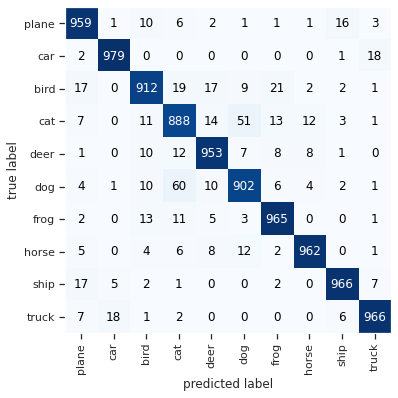

In [14]:
mat = helper.compute_confusion_matrix(model,test_loader,device)
plot_metrics.plot_confusion_matrix(mat, class_names=classes)


## Generate & Plot GradCam Images

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:974: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


torch.Size([10, 10])
Generating Grad-CAM @layer1
Generating Grad-CAM @layer2
Generating Grad-CAM @layer3
Generating Grad-CAM @layer4


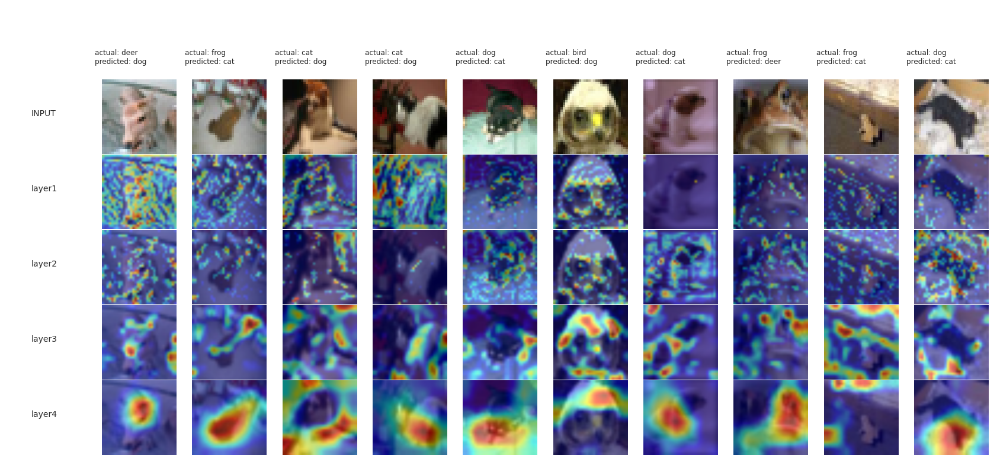

In [15]:
target_layers = ["layer1","layer2","layer3","layer4"]
gradcam_output, probs, predicted_classes = generate_gradcam(misclassified_images[:10], model, target_layers,device)
plot_gradcam(gradcam_output, target_layers, classes, (3, 32, 32),predicted_classes, misclassified_images[:10])

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:974: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


torch.Size([10, 10])
Generating Grad-CAM @layer1
Generating Grad-CAM @layer2
Generating Grad-CAM @layer3
Generating Grad-CAM @layer4


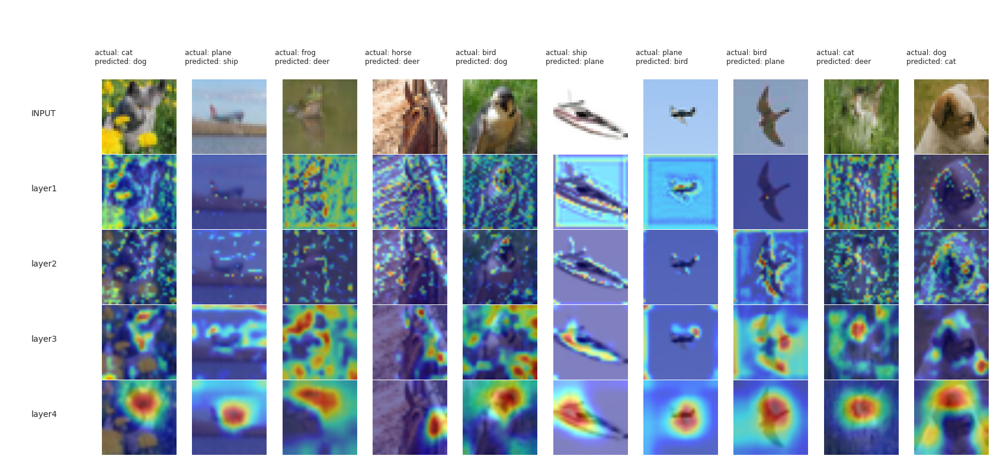

In [16]:
gradcam_output, probs, predicted_classes = generate_gradcam(misclassified_images[10:20], model, target_layers,device)
plot_gradcam(gradcam_output, target_layers, classes, (3, 32, 32),predicted_classes, misclassified_images[10:20])

In [17]:

%load_ext tensorboard
%tensorboard --logdir=runs

<IPython.core.display.Javascript object>